# Hot Dog Classifier

In [1]:
import torch 
import torchvision 
from torchvision import datasets 
from torchvision import transforms 
from torch.utils.data import DataLoader 
from torch.utils.data import random_split
import numpy as np 
import matplotlib.pyplot as plt
import glob

In [2]:
!nvidia-smi

Tue Jan 10 06:45:33 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## 0. 데이터 다운로드

In [4]:
data_dir = '/kaggle/input/hotdognothotdog/hotdog-nothotdog/'

In [5]:
train_hotdog =glob.glob(data_dir + 'train/hotdog/*.jpg')
train_nothotdog =glob.glob(data_dir + 'train/nothotdog/*.jpg')

test_hotdog =glob.glob(data_dir + 'test/hotdog/*.jpg')
test_nothotdog =glob.glob(data_dir + 'test/nothotdog/*.jpg')

## 1. 데이터 불러오기

In [6]:
transform = transforms.Compose([transforms.Resize([224, 224]), transforms.ToTensor()])

In [7]:
trainset = datasets.ImageFolder(root= data_dir + 'train', transform=transform)
testset = datasets.ImageFolder(root= data_dir + 'test', transform=transform)

In [8]:
trainset

Dataset ImageFolder
    Number of datapoints: 3000
    Root location: /kaggle/input/hotdognothotdog/hotdog-nothotdog/train
    StandardTransform
Transform: Compose(
               Resize(size=[224, 224], interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
           )

In [9]:
trainset, validset = random_split(trainset, [2500, 500])

In [10]:
print(type(trainset), len(trainset))
print(type(validset), len(validset))
print(type(testset), len(testset))

<class 'torch.utils.data.dataset.Subset'> 2500
<class 'torch.utils.data.dataset.Subset'> 500
<class 'torchvision.datasets.folder.ImageFolder'> 644


In [11]:
print(type(trainset[0][0]), type(trainset[0][1]))            

<class 'torch.Tensor'> <class 'int'>


In [12]:
# 0번째 샘플 이미지
trainset[0][0].size(), trainset[0][1]

(torch.Size([3, 224, 224]), 0)

In [13]:
# 10번째 샘플 이미지
trainset[10][0].size(), trainset[0][1]

(torch.Size([3, 224, 224]), 0)

## 2. 데이터 시각화

- tensor를 matplotlib에서 표시했을 경우

In [14]:
# 1번 샘플
sample_img = trainset[1][0]
sample_img.size()

torch.Size([3, 224, 224])

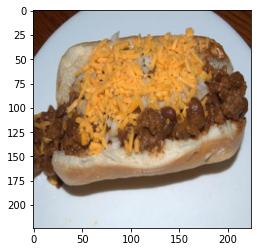

In [15]:
plt.imshow(sample_img.permute(1, 2, 0))

In [16]:
# 1번 샘플의 정답, 0는 hotdog, 1은 not hotdog
trainset[1][1]

0

- numpy로 변환한 뒤 matplotlib으로 표시할 경우

In [17]:
sample_img.size()

torch.Size([3, 224, 224])

In [18]:
numpy_sample = sample_img.numpy()
numpy_sample.shape

(3, 224, 224)

In [19]:
type(numpy_sample)

numpy.ndarray

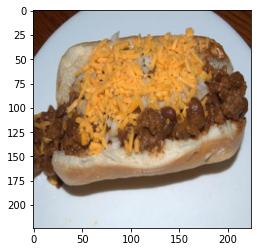

In [20]:
plt.imshow(numpy_sample.transpose(1, 2, 0)) 

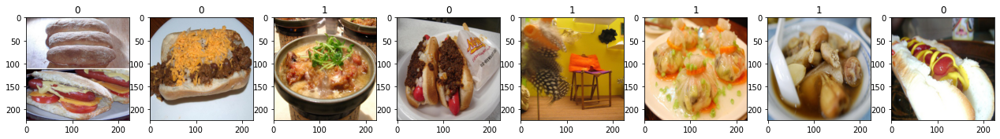

In [21]:
figure, axes = plt.subplots(nrows=1, ncols=8, figsize=(22, 6))
for i in range(8):
    axes[i].imshow(trainset[i][0].permute(1, 2, 0), cmap='gray')
    axes[i].set_title(trainset[i][1])   

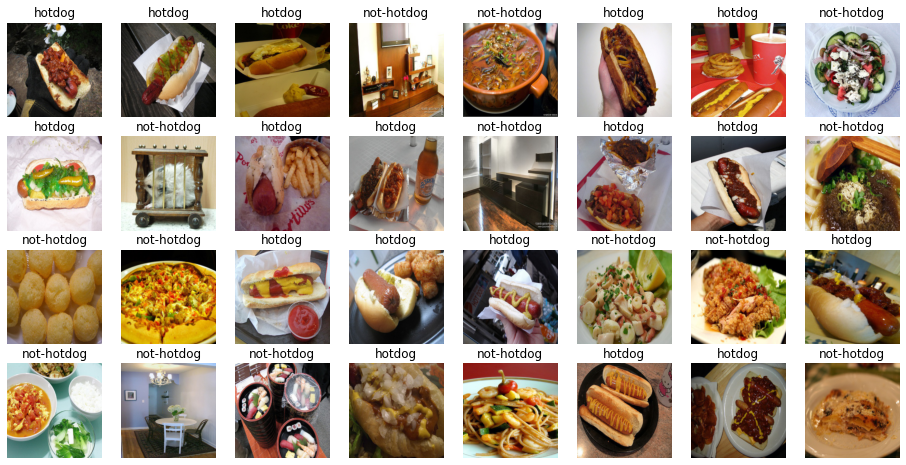

In [22]:
labels_map = {0 : 'hotdog', 1 : 'not-hotdog'}  

figure, axes = plt.subplots(nrows=4, ncols=8, figsize=(16, 8))
axes = axes.flatten()

for i in range(32):
    rand_i = np.random.randint(0, len(trainset))
    image = trainset[rand_i][0].permute(1, 2, 0)
    axes[i].axis('off')
    axes[i].imshow(image)
    axes[i].set_title(labels_map[trainset[rand_i][1]])              

## 3. 데이터 적재

In [23]:
batch_size = 16 # 100 -> 16
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True) # 훈련용
validloader = DataLoader(validset, batch_size=batch_size, shuffle=False) # 검증용
testloader = DataLoader(testset, batch_size=batch_size, shuffle=False) # 테스트용

In [24]:
print(type(trainloader), len(trainloader))
print(type(validloader), len(validloader))
print(type(testloader), len(testloader))

<class 'torch.utils.data.dataloader.DataLoader'> 157
<class 'torch.utils.data.dataloader.DataLoader'> 32
<class 'torch.utils.data.dataloader.DataLoader'> 41


In [25]:
train_iter = iter(trainloader)
images, labels = next(train_iter)
print(images.size(), labels.size())

torch.Size([16, 3, 224, 224]) torch.Size([16])


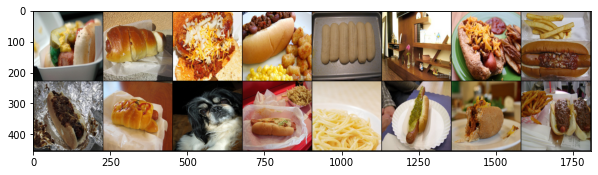

In [26]:
gird_img = torchvision.utils.make_grid(images)
plt.figure(figsize=(10, 100))
plt.imshow(gird_img.permute(1, 2, 0))

## 4. 모델 생성

In [27]:
from torch import nn 
from torch import optim 
import torch.nn.functional as F 

In [28]:
import torchvision.models as models

In [29]:
model = models.vgg16_bn(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [30]:
for parameter in model.parameters():
    print(parameter.requires_grad) 


True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [31]:
for parameter in model.parameters():
    parameter.requires_grad = False 

for parameter in model.classifier.parameters():
    parameter.requires_grad = True 

In [32]:
model.classifier[3] = nn.Linear(in_features=4096, out_features=512)
model.classifier[6] = nn.Linear(in_features=512, out_features=2)

In [33]:
model.classifier

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=512, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=512, out_features=2, bias=True)
)

In [34]:
model.to(device)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [36]:
pip install torchsummary

Note: you may need to restart the kernel to use updated packages.


In [37]:
from torchsummary import summary

In [38]:
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4         [-1, 64, 224, 224]          36,928
       BatchNorm2d-5         [-1, 64, 224, 224]             128
              ReLU-6         [-1, 64, 224, 224]               0
         MaxPool2d-7         [-1, 64, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]          73,856
       BatchNorm2d-9        [-1, 128, 112, 112]             256
             ReLU-10        [-1, 128, 112, 112]               0
           Conv2d-11        [-1, 128, 112, 112]         147,584
      BatchNorm2d-12        [-1, 128, 112, 112]             256
             ReLU-13        [-1, 128, 112, 112]               0
        MaxPool2d-14          [-1, 128,

## 5. 모델 컴파일 (손실함수, 옵티마이저 선택)

In [39]:
learning_rate = 0.0001 
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate)

In [40]:
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=7, factor=0.1, verbose=True)

## 6. 모델 훈련 (with 검증)

In [41]:
def validation(model, validloader, criterion):
    valid_accuracy = 0
    valid_loss = 0

    with torch.no_grad():
        for images, labels in validloader: 
            images, labels = images.to(device), labels.to(device)

            logits = model.forward(images) 
            _, preds = torch.max(logits, 1) 

            correct = (preds == labels).sum()

            accuracy = correct / images.shape[0]
            loss = criterion(logits, labels) 

            valid_accuracy += accuracy
            valid_loss += loss.item() 
    

    return valid_loss, valid_accuracy 


In [42]:
from torch.utils.tensorboard import SummaryWriter

writer  = SummaryWriter()

In [43]:
def train(model, epochs, criterion, optimizer):
    steps = 0
    min_loss = 10000
    max_accuracy = 0

    trigger = 0
    patience = 13 
 
    steps_per_epoch = len(trainloader) 

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for images, labels in iter(trainloader):
            steps += 1

            images, labels = images.to(device), labels.to(device)


            outputs = model.forward(images) 
            loss = criterion(outputs, labels) 


            optimizer.zero_grad() 
            loss.backward()

            optimizer.step() 

            train_loss += loss.item()
            if (steps % steps_per_epoch) == 0:
                model.eval() 
                valid_loss, valid_accuracy = validation(model, validloader, criterion)
                writer.add_scalar("Loss/train", train_loss/len(trainloader), epoch)
                writer.add_scalar("Loss/valid", valid_loss/len(validloader), epoch)
                writer.add_scalars("Loss/train and valid",
                                  {'train' : train_loss/len(trainloader),
                                  'valid' : valid_loss/len(validloader)}, epoch)

                writer.add_scalar("Valid Accuracy", valid_accuracy/len(validloader), epoch)


                print('Epoch : {}/{}.....'.format(epoch+1, epochs),
                      'Train Loss : {:.3f}'.format(train_loss/len(trainloader)),
                      'Valid Loss : {:.3f}'.format(valid_loss/len(validloader)),
                      'Valid Accuracy : {:.3f}'.format(valid_accuracy/len(validloader)))

                if valid_accuracy > max_accuracy: 
                    max_accuracy = valid_accuracy
                    torch.save(model.state_dict(), 'best_checkpoint.pth')


                if valid_loss > min_loss:
                    trigger += 1 
                    print('trigger : ', trigger )
                    if trigger > patience:
                        print('Early Stopping!!!')
                        print('Traning step is finished!!')
                        writer.flush()  
                        return   
                else:
                    trigger = 0
                    min_loss = valid_loss


                train_loss = 0
                model.train()

                scheduler.step(valid_loss)

    writer.flush()      

In [45]:
epochs=55
train(model, epochs, criterion, optimizer)

Epoch : 1/55..... Train Loss : 0.304 Valid Loss : 0.191 Valid Accuracy : 0.939
Epoch : 2/55..... Train Loss : 0.179 Valid Loss : 0.250 Valid Accuracy : 0.896
trigger :  1
Epoch : 3/55..... Train Loss : 0.080 Valid Loss : 0.188 Valid Accuracy : 0.936
Epoch : 4/55..... Train Loss : 0.048 Valid Loss : 0.212 Valid Accuracy : 0.939
trigger :  1
Epoch : 5/55..... Train Loss : 0.045 Valid Loss : 0.346 Valid Accuracy : 0.908
trigger :  2
Epoch : 6/55..... Train Loss : 0.026 Valid Loss : 0.373 Valid Accuracy : 0.900
trigger :  3
Epoch : 7/55..... Train Loss : 0.029 Valid Loss : 0.279 Valid Accuracy : 0.947
trigger :  4
Epoch : 8/55..... Train Loss : 0.022 Valid Loss : 0.285 Valid Accuracy : 0.936
trigger :  5
Epoch : 9/55..... Train Loss : 0.033 Valid Loss : 0.346 Valid Accuracy : 0.941
trigger :  6
Epoch : 10/55..... Train Loss : 0.029 Valid Loss : 0.426 Valid Accuracy : 0.904
trigger :  7
Epoch : 11/55..... Train Loss : 0.034 Valid Loss : 0.345 Valid Accuracy : 0.947
trigger :  8
Epoch 00011:

In [ ]:
%load_ext tensorboard

In [62]:
%tensorboard --logdir=runs

Output hidden; open in https://colab.research.google.com to view.

In [63]:
writer.close()

## 7. 모델 예측

In [46]:
test_iter = iter(testloader)
images, labels = next(test_iter)
images, labels = images.to(device), labels.to(device)
print(images.size(), labels.size())

torch.Size([16, 3, 224, 224]) torch.Size([16])


In [47]:
rnd_idx = 10
images[rnd_idx:rnd_idx+1].shape, labels[rnd_idx:rnd_idx+1] 

(torch.Size([1, 3, 224, 224]), tensor([0], device='cuda:0'))

In [48]:
img = images[rnd_idx:rnd_idx+1]
with torch.no_grad():
    model.eval() 
    logit = model.forward(img)

pred = logit.max(dim=1)[1]
pred == labels[rnd_idx]

tensor([True], device='cuda:0')

In [49]:
pred, labels[rnd_idx] 

(tensor([0], device='cuda:0'), tensor(0, device='cuda:0'))

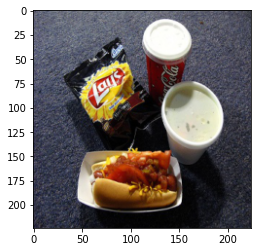

In [50]:
img = img.cpu()
plt.imshow(img[0].permute(1, 2, 0)) 

## 8. 모델 평가

In [51]:
def evaluation(model, testloader, criterion):
    test_accuracy = 0
    test_loss = 0

  
    with torch.no_grad():
        model.eval()
    for images, labels in testloader:
        images, labels = images.to(device), labels.to(device)

      
        logits = model.forward(images) 
        _, preds = torch.max(logits, 1)
        correct = (preds == labels).sum()

        accuracy = correct / images.shape[0]
        loss = criterion(logits, labels) 

        test_accuracy += accuracy.item()
        test_loss += loss.item() 


    print('Test Loss : ', test_loss/len(testloader))
    print('Test Accuracy : ', test_accuracy/len(testloader))


In [52]:
evaluation(model, testloader, criterion)

Test Loss :  0.4445585794558287
Test Accuracy :  0.9146341463414634


## 9. 모델 저장# 

In [53]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [54]:
model.state_dict().keys()

odict_keys(['features.0.weight', 'features.0.bias', 'features.1.weight', 'features.1.bias', 'features.1.running_mean', 'features.1.running_var', 'features.1.num_batches_tracked', 'features.3.weight', 'features.3.bias', 'features.4.weight', 'features.4.bias', 'features.4.running_mean', 'features.4.running_var', 'features.4.num_batches_tracked', 'features.7.weight', 'features.7.bias', 'features.8.weight', 'features.8.bias', 'features.8.running_mean', 'features.8.running_var', 'features.8.num_batches_tracked', 'features.10.weight', 'features.10.bias', 'features.11.weight', 'features.11.bias', 'features.11.running_mean', 'features.11.running_var', 'features.11.num_batches_tracked', 'features.14.weight', 'features.14.bias', 'features.15.weight', 'features.15.bias', 'features.15.running_mean', 'features.15.running_var', 'features.15.num_batches_tracked', 'features.17.weight', 'features.17.bias', 'features.18.weight', 'features.18.bias', 'features.18.running_mean', 'features.18.running_var', 

In [55]:
torch.save(model.state_dict(), 'last_checkpoint.pth')

In [56]:
last_state_dict = torch.load('last_checkpoint.pth')
last_state_dict.keys()

odict_keys(['features.0.weight', 'features.0.bias', 'features.1.weight', 'features.1.bias', 'features.1.running_mean', 'features.1.running_var', 'features.1.num_batches_tracked', 'features.3.weight', 'features.3.bias', 'features.4.weight', 'features.4.bias', 'features.4.running_mean', 'features.4.running_var', 'features.4.num_batches_tracked', 'features.7.weight', 'features.7.bias', 'features.8.weight', 'features.8.bias', 'features.8.running_mean', 'features.8.running_var', 'features.8.num_batches_tracked', 'features.10.weight', 'features.10.bias', 'features.11.weight', 'features.11.bias', 'features.11.running_mean', 'features.11.running_var', 'features.11.num_batches_tracked', 'features.14.weight', 'features.14.bias', 'features.15.weight', 'features.15.bias', 'features.15.running_mean', 'features.15.running_var', 'features.15.num_batches_tracked', 'features.17.weight', 'features.17.bias', 'features.18.weight', 'features.18.bias', 'features.18.running_mean', 'features.18.running_var', 

In [57]:
last_model = model
last_model.to(device)
last_model.load_state_dict(last_state_dict)

<All keys matched successfully>

In [58]:
evaluation(last_model, testloader, criterion)

Test Loss :  0.4445585794558287
Test Accuracy :  0.9146341463414634


In [59]:
best_state_dict = torch.load('best_checkpoint.pth')

In [60]:
best_model = model
best_model.to(device)
best_model.load_state_dict(best_state_dict)


<All keys matched successfully>

In [61]:
evaluation(best_model, testloader, criterion)

Test Loss :  0.45316443885359337
Test Accuracy :  0.9146341463414634
